# Review classificator

Data download from [Kaggle](https://www.kaggle.com/datasets/fredericods/ptbr-sentiment-analysis-datasets?resource=download)

Data dictionary

- **review_text**: The text of review
- **polarity**: Review as Positive (1) or Negative (0)

In [44]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

In [45]:
reviews = pd.read_csv("../data/b2w.csv")
reviews.head()

,original_index,review_text,review_text_processed,review_text_tokenized,polarity,rating,kfold_polarity,kfold_rating
0,11955,Bem macio e felpudo...recomendo. Preço imbatí...,bem macio e felpudo...recomendo. preco imbati...,"['bem', 'macio', 'felpudo', 'recomendo', 'prec...",1.0,4,1,1
1,35478,Produto excepcional! recomendo!!! inovador e ...,produto excepcional! recomendo!!! inovador e ...,"['produto', 'excepcional', 'recomendo', 'inova...",1.0,5,1,1
2,122760,recebi o produto antes do prazo mas veio com d...,recebi o produto antes do prazo mas veio com d...,"['recebi', 'produto', 'antes', 'do', 'prazo', ...",0.0,1,1,1
3,17114,Bom custo beneficio. Adequado para pessoas que...,bom custo beneficio. adequado para pessoas que...,"['bom', 'custo', 'beneficio', 'adequado', 'par...",1.0,5,1,1
4,19112,Além de higiênico tem o tamanho ideal. Só falt...,alem de higienico tem o tamanho ideal. so falt...,"['alem', 'de', 'higienico', 'tem', 'tamanho', ...",NaN,3,-1,1


In [46]:
reviews.drop(["original_index", "review_text_processed", "review_text_tokenized", "rating", "kfold_polarity", "kfold_rating"], axis=1, inplace=True)
reviews.dropna(axis=0, inplace=True)
reviews.head()

,review_text,polarity
0,Bem macio e felpudo...recomendo. Preço imbatí...,1.0
1,Produto excepcional! recomendo!!! inovador e ...,1.0
2,recebi o produto antes do prazo mas veio com d...,0.0
3,Bom custo beneficio. Adequado para pessoas que...,1.0
5,"ótmo produto atendeu as expectativas, a entreg...",1.0


In [47]:
reviews.polarity.value_counts()

polarity
1.0    80300
0.0    35758
Name: count, dtype: int64

In [48]:
train, test, train_class, test_class = train_test_split(reviews.review_text, reviews.polarity, stratify=reviews.polarity, test_size=0.2, random_state=42)

In [49]:
train_class.head()

70915     1.0
97437     1.0
76966     1.0
92458     0.0
124701    1.0
Name: polarity, dtype: float64

In [50]:
# This code does not work because logistic regression does not accept strings

# logistic_regression = LogisticRegression()
# logistic_regression.fit(train, train_class)
# acuracy = logistic_regression.score(test, test_class)

# print(acuracy)

## Using bag of words

In [51]:
from sklearn.feature_extraction.text import CountVectorizer

#Example
text = ["This is the first document.", "This document is the second document.", "And this is the third one.", "Is this the first document?"]
vectorizer = CountVectorizer()
bag_of_words = vectorizer.fit_transform(text)

bag_of_words

<Compressed Sparse Row sparse matrix of dtype 'int64'
	with 21 stored elements and shape (4, 9)>

In [52]:
sparce_matrix = pd.DataFrame.sparse.from_spmatrix(bag_of_words, columns=vectorizer.get_feature_names_out())
sparce_matrix

,and,document,first,is,one,second,the,third,this
0,0,1,1,1,0,0,1,0,1
1,0,2,0,1,0,1,1,0,1
2,1,0,0,1,1,0,1,1,1
3,0,1,1,1,0,0,1,0,1


In [53]:
vectorizer = CountVectorizer()
bag_of_words = vectorizer.fit_transform(reviews.review_text)
print(bag_of_words.shape)


(116058, 50508)


In [54]:
vectorizer = CountVectorizer(max_features=100) # limiting the number of features
bag_of_words = vectorizer.fit_transform(reviews.review_text)
print(bag_of_words.shape)


(116058, 100)


In [55]:
sparce_matrix = pd.DataFrame.sparse.from_spmatrix(bag_of_words, columns=vectorizer.get_feature_names_out())
sparce_matrix

,agora,ainda,americanas,antes,ao,aparelho,as,até,bem,boa,...,ter,tive,todos,tudo,um,uma,uso,veio,ótima,ótimo
0,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,1,1,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0
3,0,0,0,0,0,2,0,0,0,0,...,0,0,0,0,1,0,1,0,0,0
4,0,0,0,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116053,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
116054,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
116055,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
116056,0,0,0,0,2,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [56]:
train, test, train_class, test_class = train_test_split(bag_of_words, reviews.polarity, stratify=reviews.polarity, test_size=0.2, random_state=42)

logistic_regression = LogisticRegression()
logistic_regression.fit(train, train_class)
acuracy = logistic_regression.score(test, test_class)

print(acuracy)

0.8867826986041702


### Predicting

In [ ]:
new_text = ["Produto muito ruim"]
prediction_bag_of_words = vectorizer.transform(new_text)

prediction = logistic_regression.predict(prediction_bag_of_words)

print(prediction)

[1.]


In [58]:
def train_model(text_column, target_column):
    vectorizer = CountVectorizer(max_features=100) # limiting the number of features
    bag_of_words = vectorizer.fit_transform(text_column)

    train, test, train_class, test_class = train_test_split(bag_of_words, target_column, stratify=target_column, test_size=0.2, random_state=42)

    logistic_regression = LogisticRegression()

    logistic_regression.fit(train, train_class)

    return logistic_regression.score(test, test_class)


In [59]:
print(train_model(reviews.review_text, reviews.polarity))

0.8867826986041702


## Word cloud

In [60]:
from wordcloud import WordCloud

all_reviews = [text for text in reviews.review_text]
all_words = ' '.join(all_reviews)
print(all_words)

Bem macio e felpudo...recomendo.  Preço imbatível e entrega rápida. Compraria outro quando precisar Produto excepcional!  recomendo!!! inovador e gostoso de ler!! recebi o produto antes do prazo mas veio com defeito na trava ou seja não da para usar e até agora a Americanas não resolveu e preciso muito deste produto Bom custo beneficio. Adequado para pessoas que fazem um uso casual do aparelho . A máquina fotográfica é excelente . A tela fornece imagens ótimas . Os recursos do aparelho são fáceis de manejar. ótmo produto atendeu as expectativas, a entrega ocorreu antes do previsto. muito bom GOSTEI MUITO DO PRODUTO! TEM ÓTIMA QUALIDADE, E FACILITA MUITO A APLICAÇÃO DO GEL. Adorei, entrega no prazo e produto conforme eu esperava, recomendadíssimo. Já é o segundo processador deste modelo que compro (o primeiro foi para minha mãe) e só tenho elogios. É muito forte e facilita bastante os processos. Nao recebi!!!  endereço para entrega : rua augusto hog, 186 casa 02 jardim presidente dutra 

In [61]:
word_cloud = WordCloud().generate(all_words)

In [62]:
word_cloud

(np.float64(-0.5), np.float64(399.5), np.float64(199.5), np.float64(-0.5))

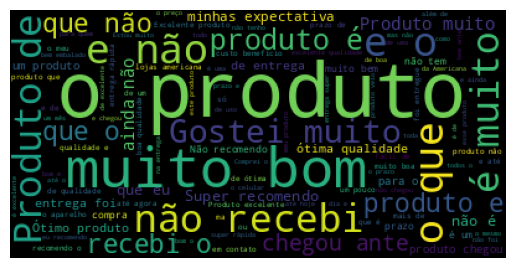

In [63]:
from matplotlib import pyplot as plt

plt.figure()
plt.imshow(word_cloud)
plt.axis("off")

In [64]:
word_cloud = WordCloud(width=800, height=500, max_font_size=110).generate(all_words)

(np.float64(-0.5), np.float64(799.5), np.float64(499.5), np.float64(-0.5))

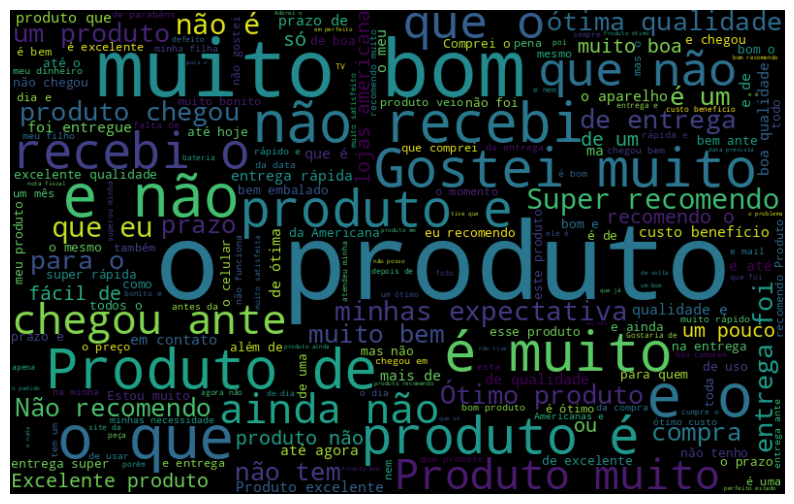

In [65]:
from matplotlib import pyplot as plt

plt.figure(figsize=(10, 7))
plt.imshow(word_cloud, interpolation="bilinear")
plt.axis("off")

In [66]:
def word_cloud_negative(data, text_column):
    negative_text = data.query("polarity == 0")

    all_reviews = [text for text in negative_text[text_column]]
    all_words = ' '.join(all_reviews)
    
    word_cloud = WordCloud(width=800, height=500, max_font_size=110, collocations=False).generate(all_words)

    from matplotlib import pyplot as plt

    plt.figure(figsize=(10, 7))
    plt.imshow(word_cloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()

In [67]:
def word_cloud_positive(data, text_column):
    negative_text = data.query("polarity == 1")

    all_reviews = [text for text in negative_text[text_column]]
    all_words = ' '.join(all_reviews)
    
    word_cloud = WordCloud(width=800, height=500, max_font_size=110, collocations=False).generate(all_words)

    from matplotlib import pyplot as plt

    plt.figure(figsize=(10, 7))
    plt.imshow(word_cloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()

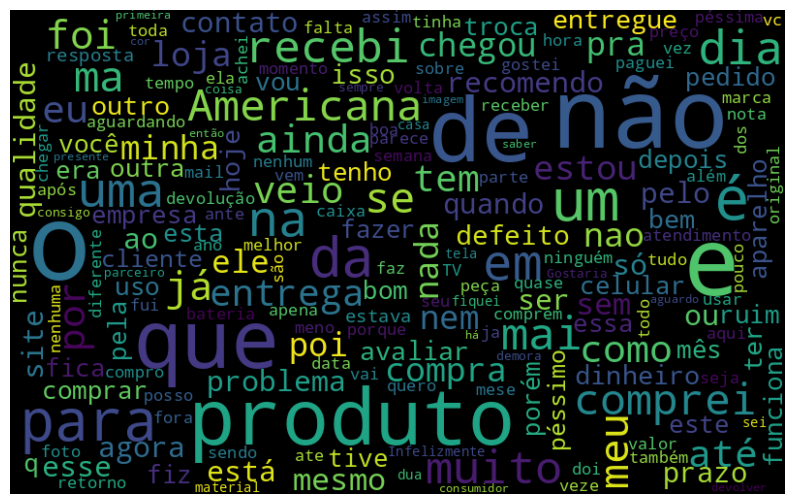

In [68]:
word_cloud_negative(reviews, "review_text")

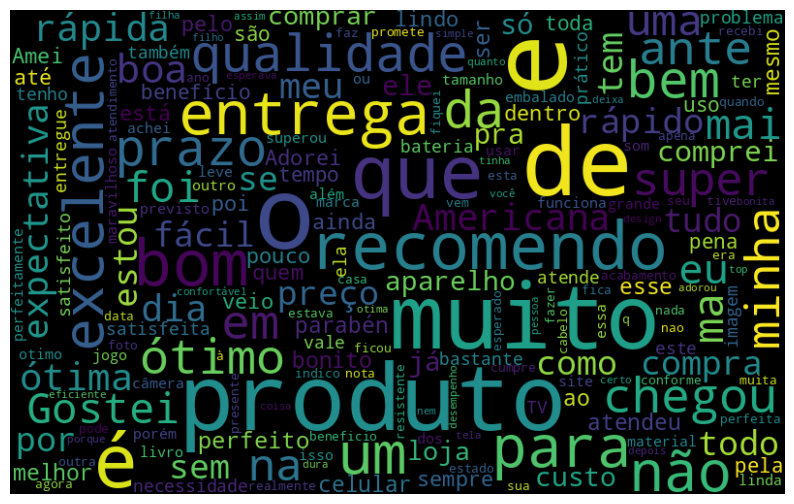

In [69]:
word_cloud_positive(reviews, "review_text")